# Long Video Voice Recognition

## 1. Get Audio File

In [1]:
! pip install SpeechRecognition
! pip install -U yt-dlp

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 32.8 MB 81.1 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 2.6 MB 4.2 MB/s 
     |████████████████████████████████| 357 kB 53.3 MB/s 
     |████████████████████████████████| 218 kB 53.0 MB/s 
     |████████████████████████████████| 2.0 MB 45.1 MB/s 
     |████████████████████████████████| 112 kB 15.2 MB/s 


In [2]:
!ffmpeg

ffmpeg version 3.4.8-0ubuntu0.2 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.2 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvorbis --enable-libvpx --enable-libwavpack --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lib

In [3]:
import speech_recognition as sr
import os
from time import time

def download(url, fname):
    """
    download wav file from `url` as `fname`
    """
    os.system(f"yt-dlp -P ./data -o '{fname}.%(ext)s' -x --audio-format wav {url}")

def to_text(fname, language='en-US', adjust_for_noise=True):
    r = sr.Recognizer()
    data = sr.AudioFile(fname)  # fname으로부터 wav data load

    with data as source:
        if adjust_for_noise:
            r.adjust_for_ambient_noise(source)  # 공간 소음 캔슬링
        audio = r.record(source)    # recognizer-audio 생성

    print(f'Recognize {fname}')

    start = time()
    text = r.recognize_google(audio, language=language)  # recognizing
    print(f'Time elapsed: {time() - start}')

    return text

In [4]:
short_url = "https://www.youtube.com/watch?v=_nAov8LnFS4&list=PLalDxVXf3NHdC-GsbCQVeTQiCo2Y85F17&index=4&ab_channel=JoongheonKim"
long_url = "https://www.youtube.com/watch?v=M27xbxCtK6c&list=PLKs7xpqpX1beJ5-EOFDXTVckBQFFyTxUH&index=2&ab_channel=SNUCML"

download(short_url, 'short')
download(long_url, 'long')

## 2. Audio Processing

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib

from scipy.io import wavfile
from tqdm import tqdm

matplotlib.rcParams["figure.figsize"] = (24, 5)

In [11]:
freq, data = wavfile.read('data/short.wav')

In [12]:
print(f'data size: {data.nbytes / 1e6:.2f} MB')

data size: 375.56 MB


In [13]:
data = data[:freq*600]
wavfile.write('sample.wav', freq, data)

In [14]:
freq, data = wavfile.read('sample.wav')

### ~~2.1 이동평균을 통한 오디오 길이 축소~~

- covolution operation

$$ (f*g)(x) = \int_{0}^{x} f(\tau)g(x-\tau) d\tau $$

**너무 오래 걸림**

In [ ]:
def moving_average(arr, window_size):
    result = np.convolve(np.abs(arr), np.ones(window_size), mode='valid') / window_size
    return result.astype(np.int16)

In [ ]:
moving_avg_data = moving_average(data[:freq*10], freq//10)

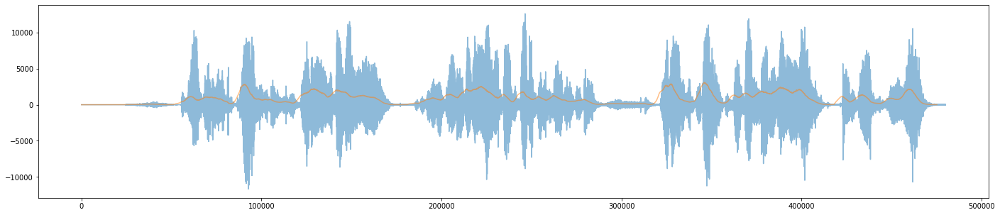

In [ ]:
plt.figure(figsize=(24,5))
plt.plot(data[:freq*10], alpha=0.5)
plt.plot(moving_avg_data, alpha=0.5)

In [ ]:
wavfile.write('mov_avg_sample.wav', int(len(moving_avg_data)/10), moving_avg_data)

### 2.2 Resampling

Fourier Transformation을 이용한 리샘플링

In [7]:
from scipy import signal

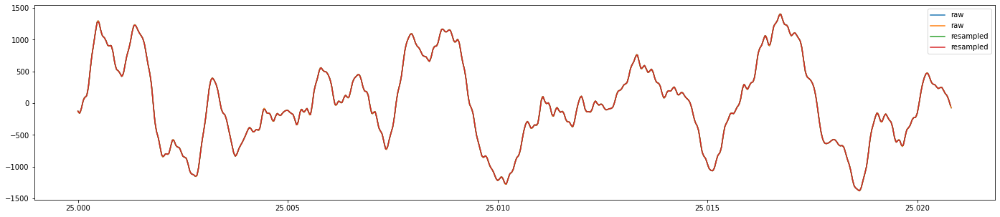

In [ ]:
def idx_range(t_start, t_end, freq):
    return int(t_start*freq), int(t_end*freq)

ta, tb = 25, 25+1000/freq
ia, ib = idx_range(ta, tb, freq)
ja, jb = idx_range(ta, tb, freq//2)

plt.figure(figsize=(24,5))
plt.plot(np.linspace(ta, tb, ib-ia, endpoint=False), data[ia:ib], label='raw')
plt.plot(np.linspace(ta, tb, jb-ja, endpoint=False), signal.resample(data[ia:ib], jb-ja), label='resampled')
plt.legend()
plt.show()

In [15]:
resampled_data = signal.resample(data, len(data)//3).astype(np.int16)
resampled_freq = int(freq * len(resampled_data)/len(data))
print(resampled_freq)

wavfile.write('resampled_data.wav', resampled_freq, resampled_data)

16000


### 2.3 Silence Truncation

- dBFS (Decibels relative to Full Scale)  

$$ L_B = \frac{1}{10}\log_{10} \frac{A}{M} $$

(M: max amplitude)

In [9]:
!pip install pydub

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [16]:
from pydub import AudioSegment, silence

# audio = AudioSegment(data.tobytes(),
#                      frame_rate=freq,
#                      sample_width=data.dtype.itemsize,
#                      channels=1)

audio = AudioSegment.from_wav('resampled_data.wav')
# audio = AudioSegment.from_wav('sample.wav')

In [ ]:
audio

In [ ]:
audio.dBFS

-28.62462496440958

#### Normalize

Max amplidute를 특정 dBFS로 설정

In [17]:
def match_target_amplitude(sound, target_dBFS):
    change_in_dBFS = target_dBFS - sound.dBFS
    return sound.apply_gain(change_in_dBFS)

norm_audio = match_target_amplitude(audio, -20.0)

In [18]:
norm_audio

In [23]:
norm_audio.dBFS

-20.04464669783558

In [24]:
dBFS_list = [norm_audio[i].dBFS for i in range(len(norm_audio))]
dBFS_list = np.clip(np.array(dBFS_list), -100, 0)

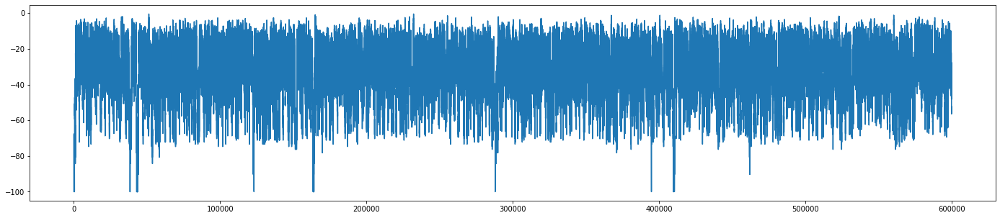

In [25]:
plt.figure(figsize=(24,5))
plt.plot(dBFS_list)

In [26]:
np.mean(dBFS_list)

-32.30165096052909

In [27]:
np.mean(dBFS_list)-np.std(dBFS_list)

-47.1289718446176

#### silence remove

In [28]:
import time

st = time.time()
segments = silence.split_on_silence(norm_audio, 
                                    min_silence_len=350, 
                                    silence_thresh=-40, 
                                    keep_silence=100,
                                    seek_step=1)

print('time elapsed: {0}m {1}s'.format(*divmod(int(time.time()-st), 60)))

time elapsed: 0m 28s


In [29]:
truncated_audio = sum(segments)
print(divmod(len(truncated_audio)/1000, 60))

(8.0, 32.15999999999997)


In [30]:
truncated_audio

In [31]:
truncated_audio.export('truncated_sample.wav', format='wav')

<_io.BufferedRandom name='truncated_sample.wav'>

## 3. Voice Recognition

### 3.1 1분 내로 오디오 자르기

In [32]:
def merge_audio(segments, max_time, second=1000):
    """
    overlap은 한 seg가 max_time을 넘어서 앞뒤로 겹치게 자른 부분을 표시하는 역할
    
    이 overlap 정보를 가지고 recognize를 오류 없이 진행하는 코드 개발 필요
    """
    splited_audios = []
    overlap_chunks = []
    length = 0
    i,j = 0, 0
    while i < len(segments):
        seg = segments[i]
        length += len(seg)
        if length > max_time*second:
            if i>j:
                splited_audios.append(sum(segments[j:i]))
                length = 0
            else:
                splited = [seg[t:t+59*second] for t in range(0, len(seg), 57*second)]
                overlap_chunks.append((i, i+len(splited)))
                splited_audios += [seg[t:t+59*second] for t in range(0, len(seg), 57*second)]
                i += 1
            j = i
        else:
            i += 1
    else:
        splited_audios.append(sum(segments[j:]))
    
    return splited_audios, overlap_chunks

In [33]:
splited_audios, overlap = merge_audio(segments, 60)
overlap

[]

In [34]:
# 길이 확인
np.array(list(map(len, splited_audios)))/1000

array([59.991, 59.219, 57.332, 59.756, 58.56 , 59.942, 54.791, 58.778,
       43.791])

In [35]:
sum(splited_audios)

In [36]:
splited_audios[1][-5*1000:]

In [37]:
splited_audios[2][:5*1000]

### 3.2 음성 인식하기

In [ ]:
def recognize(audios, overlap, language='en-US', adjust_for_noise=True):
    text = []
    for audio_segment in audios:
        audio_segment.export('tmp_seg.wav', format='wav')
        text.append(to_text('tmp_seg.wav', language, adjust_for_noise))

    return text

In [ ]:
texts = recognize(splited_audios, [], 'ko-KR')

Recognize tmp_seg.wav
Time elapsed: 6.789165258407593
Recognize tmp_seg.wav
Time elapsed: 7.711457252502441
Recognize tmp_seg.wav
Time elapsed: 8.639584302902222
Recognize tmp_seg.wav
Time elapsed: 8.608815908432007
Recognize tmp_seg.wav
Time elapsed: 5.712741374969482
Recognize tmp_seg.wav
Time elapsed: 8.991209745407104
Recognize tmp_seg.wav
Time elapsed: 8.237101316452026
Recognize tmp_seg.wav
Time elapsed: 8.456383228302002
Recognize tmp_seg.wav
Time elapsed: 5.289525508880615


['침해당하는 인공신경망에 대해서 알아보도록 하겠습니다 이름 자체로 저희가 런닝이 멍청이가 부리네요 이건 이제 비선형 분류기를 설계한다는 개념을 이렇게 부른 거고요 우린 지금까지 리니어 컴비네이션 한 번 수행하는 선영이 함수에 대해서 바랬지만 지금 이제 히든 한 구조를 가짐으로써 내리냐 컴비네이션 중첩해서 쌓기 되고 나서 이걸 통해서 비선형성을 파악한다 보시면되겠습니다 많은 분들이 어려 보인데요 실제로 보면 굉장히 싶습니다 한번 같이 살아 보도록 하겠습니다 그 소리가 이제 인공신경망의 기초에 대해서 이제 시작 할 거야 4시 일어나게 구조에서 나왔다고 말을 합니다 위에 있는 일원에서 아래는 신경세포로 이제 데이터 전달한다고 한다면 신경 데이터들이 쪽 나오겠죠 그러면 그 모든게 반대쪽으로 전달될때 받는 사람 입장에서 그 신호를 그대로 받아들이는게 아니라 증폭을 하기도 하고 감세를 시키기로 하고 영어로 급해서 없애주기도 합니다 무관하다면 그 신호 받을 수 없게',
 '도착했을 때 다 합해서 우리가 어떠한 기준 역치를 넘느냐 혹은 넉넉지 못한 야로 신호에 전달이 활성화 됐느냐 그렇지 않냐를 따름이다이 과정을 우리가 수식하는 담당 거 같습니다 신호들이 들어왔을 때 우리가 그것을 가중치를 부칩니다 이게 일 보다 큰 숫자 나면 우리는 증폭시킨 거고요 이게 0과 1 사이라면 우리는 감세를 찍은 거고요 0이라면 우리는 그 숫자를 없으신 거 없고요 일이라면 있는 그대로 받아 준게 되겠죠 어쨌든 이렇게 가중치를 적용하고 다음에 그걸 다 더 하고 그것을 이제 기준치를 통해서 그 기준을 넘느냐 마느냐를 판단하는데 액티베이션 함수라고 하여 이거 얼마냐고요 시그모이드 함수로 가정한다면 그러면 기준치 0.5 되겠죠 0.5 넘으면 활성 못 넣으면 비활성 1 0 2 이런 관리하기 때문에 이거는 이제 불명 똑같이 생겼네 더블유로 보는 것처럼 미녀 콤비네이션 하고 거기다가 뭐 바이러스 영어로 쉰다며',
 '방수 액티베이션 시도 못 쉬어서 이걸 가지고 이게 바로 우리의 hx8 모델이니까 너희 값이

In [ ]:
#@title
texts = ['침해당하는 인공신경망에 대해서 알아보도록 하겠습니다 이름 자체로 저희가 런닝이 멍청이가 부리네요 이건 이제 비선형 분류기를 설계한다는 개념을 이렇게 부른 거고요 우린 지금까지 리니어 컴비네이션 한 번 수행하는 선영이 함수에 대해서 바랬지만 지금 이제 히든 한 구조를 가짐으로써 내리냐 컴비네이션 중첩해서 쌓기 되고 나서 이걸 통해서 비선형성을 파악한다 보시면되겠습니다 많은 분들이 어려 보인데요 실제로 보면 굉장히 싶습니다 한번 같이 살아 보도록 하겠습니다 그 소리가 이제 인공신경망의 기초에 대해서 이제 시작 할 거야 4시 일어나게 구조에서 나왔다고 말을 합니다 위에 있는 일원에서 아래는 신경세포로 이제 데이터 전달한다고 한다면 신경 데이터들이 쪽 나오겠죠 그러면 그 모든게 반대쪽으로 전달될때 받는 사람 입장에서 그 신호를 그대로 받아들이는게 아니라 증폭을 하기도 하고 감세를 시키기로 하고 영어로 급해서 없애주기도 합니다 무관하다면 그 신호 받을 수 없게',
 '도착했을 때 다 합해서 우리가 어떠한 기준 역치를 넘느냐 혹은 넉넉지 못한 야로 신호에 전달이 활성화 됐느냐 그렇지 않냐를 따름이다이 과정을 우리가 수식하는 담당 거 같습니다 신호들이 들어왔을 때 우리가 그것을 가중치를 부칩니다 이게 일 보다 큰 숫자 나면 우리는 증폭시킨 거고요 이게 0과 1 사이라면 우리는 감세를 찍은 거고요 0이라면 우리는 그 숫자를 없으신 거 없고요 일이라면 있는 그대로 받아 준게 되겠죠 어쨌든 이렇게 가중치를 적용하고 다음에 그걸 다 더 하고 그것을 이제 기준치를 통해서 그 기준을 넘느냐 마느냐를 판단하는데 액티베이션 함수라고 하여 이거 얼마냐고요 시그모이드 함수로 가정한다면 그러면 기준치 0.5 되겠죠 0.5 넘으면 활성 못 넣으면 비활성 1 0 2 이런 관리하기 때문에 이거는 이제 불명 똑같이 생겼네 더블유로 보는 것처럼 미녀 콤비네이션 하고 거기다가 뭐 바이러스 영어로 쉰다며',
 '방수 액티베이션 시도 못 쉬어서 이걸 가지고 이게 바로 우리의 hx8 모델이니까 너희 값이 0.9 다크니 아니냐로 우리가 바이너리로 일인지 영접한다 했으니까 어 이거 완전히 이진분류기랑 똑같구나라는 걸 수 있으십니다 그러면 지금까지 우리가 그 인풋 어떤 모델의 학습시킬 때 벡터의 사이즈 같은 거 세 개 있는 경우 전 우리 지금까지 꼭 항상 세계는 아니었어요 우리 했던 예절을 보면 우리 만약에 제일 먼저 있던 선형회귀분석 있다 그러면 시험 공부 하는 시간과 가지고 있는 기출문제 양 이런 것처럼 두 개 값을 했지만 지금 인풋 세 개가 있으니까 우리는 전세계에서 타고 들어와서 9 플레이어에서 용돈을 일로 나가는 뭐 그런 일을 볼 수 있죠 근데 중간에 줄게 그때 바로 우리가 많으면 많을수록 이게 하나 하나가 다빈이가 컴비네이션 해당하기 때문에 이게 웨딩 컨벤션 싫은 우리 나중에 가면 알아볼 거예요 우리가 콤비네이션 총 10가지',
 '되겠습니다이 그림에 대한 구체적인 해석은 다음에 나오겠지만 우리가 여기서 애들 건 뭐냐면 히든 애랑 구조로 싸움으로써 비선형성을 증가시킨다 거기까지만 일단 우리가 마음 속에 좀 기억해 두겠습니다 아직 얘는 안 되실 거 있어요 추가적으로 쓴게 살짝 왼쪽에 있네요 원래 여기 레이어를 하고 있었습니다이 그림이 되게 유명한 스탠포드대학교 강의 노트에 유명한 오픈 돼 있는 강에서의 노트 가져온 건데 세차의 달인 거거든요 사실 내 의견이 많습니다이어서 그러고 아무것도 없습니다 하지만 프로그래밍 하는 사람들 입장에서는 인풋은 그냥 데이터를 받아들이는 것이 뿐이고 어 이거 하나 하나가 행렬 현상입니다 우리는 지금까지 리어콤비네이션 1번까지 만한 리니어 평소에 대해서 들었어요 힐링 없었고 아웃 플레이 하나만 있었기에 우리가 인형커미션 딱 한 번만 한 모델을 다루었지만 인공신경망부터는 이렇게 해도 내가 끼어들 물었어',
 '2번 이상하게 되고 따라서 비선형 부르기 달라고 말을 합니다 만약에 우리가 시드니행 없다고 해 볼까요 뭐 우리가 선영이 불교 한다고 하면 우리가 예전에 고전적으로 있다 논리회로 호스트시스템에서 되면은 앤드게이트 or 게이트 설계할 수 있어요 혹시 선영이 부르기로 왜냐 하는게 뭐죠 우리가 거짓 거짓 거짓 참 참 참 참 이렇게 있을 때 하는 건 두 가지가 모두 참여하시면 참이고 그렇지 않으면 거짓이다 거짓이야 하나로 섞였으면 것입니다 and 그러면 AB 둘 다 참여했지만 주려고 아침이고 둘 중에 하나 거짓이면 결과는 것이 되겠죠 참을 인자 그러고 것을 연결한다면 영콤마영 응 거짓말 두 개는 거니까 그런 거지 여기 될 것이고 1천만 영도 마찬가지로 명이 있으니까 현대해상 것이 될 것이고 연꽃만 일도 마찬가지로 영어에 들어가 있기 때문에 것이 될 것이고 1마일은 둘 다 참이기 때문에 이거 참이 될 것이고 따라서 검은색 동그라미가 되는 법',
 '이것을 성령의 불로 해라 그런다면 선을 그어 벌써 2주가 된 거죠 성령의 불로 할 수 있다면 지금까지 해왔던 바이너리 클래시피케이션 영광이를 구별하는 거니까 지금까지 들었던 다이노 클래식 하는 그냥 부르면 낍니다 같은 경우는 뭐냐면요 AOA 그러면 둘 모두 것이 아닌 이상 참이에요 참이 하나로교회 있으면 그 참입니다 8nb 그랬으면 AB 둘 중에 하나가 참 얘기만 하면 무조건 참이에요 둘 모두 다 있을 때만 거짓입니다 참을이라고 한다면 영콤마영은 거짓이 될 거고요 그 외 나머지는 참을 하시고 있기 때문에 까만색 동그라미 친 사람이 될 겁니다 이것을 성령의 불로 계단 오라 그러면 이렇게 하면 되겠죠 불가능한 것이 우리의 문제는 뭐냐면 EXO 엑소 아는 어떻게 생겼길래 왜 문제가 되는 야 이렇게 생긴 거예요 이거는 사람은 아무리 많아도 안 되죠 이렇게 나와서 위에는 일 안에 인형이다 그러면 예일 맞고 약 먹고 역 맞지만 얘는 영향이',
 '뭐 이게 아니라 다르게 나는 못 가요 이렇게 나올 거면 여기가 여기가 이제 그러면 이거 하나만 꼭 하나 맞고 틀리고 틀렸으니까 50% 얘를 갖다 놓고 봤을 때이 그림에서는 어떻게 나오는지간에 직선 하나로 영광이를 깔끔하게 100% 나눌 수 있는 방법이 없어요 따라서이 때 어떻게 하느냐가 문제입니다 이게 바로 1969년에 mita 계셨던 마주 민수기 교수님이이 문제를 거론하면서 우리는 선영이 부르기만 쓰는 것보다 비선형 불교에서 주면 이거 구별할 수 있을 텐데라고 말씀하셨습니다 그 책임은 바로에서 퍼셉트론이란 책 있었는데 그 책에서는 이제 멀티레이어 퍼셉트론 그래서 mlp라는 구조대 세계 합니다 레이어가 하나만 있는게 나 여러 개가 있다는 소리가 되겠죠 여러 개 레이어가 있는 우리의 신경만 구조입니다 맞아 아까 봤던 것처럼 임프 씻고 히든 해가 2개있고 아웃플레어 하나 더 있어요 일하고 수고해 첫 번째 골 HD',
 '2 마지막 오라고 한다면 이거는 우리 인풋 그냥 임팩트가 들어 오라 그랬으니까 레이어는 아니고 총 레이어가 우리는 이건 세 개가 있다고 말을 합니다 항상 않았기 때문에 만약에 레이어가 새겨 있다면 그 말인즉슨 우리는 두 개 있다라고 말을 해요 근데 한 개의 내용을 있다고 하면 무조건 하는 거기 때문에 힘든 거 하나 없다는 소리거든요 힘드네요가 없는 경우입니다가 있기 때문에 얘는 플레이어 하나를 고려한다면 여기 하나 있는 거야 얘는 기동력을 하나 존재합니다 여기 컴비네이션 연산이 한 번 더 키워드 멋있죠 따라서 여기는 믿음의 없으니까 성령의 불로 하게 될 것이고 3 1로 많이 지났습니다 권한으로 만나요 엑소랑 똑같거든요 회의가 있었으니까 근데 보시다시피 100% 정확히 못 나는 저 도넛이 두 개가 짤려서 이거 깔려 있는 그럼 모양의 이런 구조도 선으로만 이렇게 나눌 수 있는게 하나 LA 엄마가 주는 거고요 두 개를 갖고 있다면 우리가',
 '그럼으로써 a 와 b를 정확하게 구별할 수 있고 여기 두 개를 이렇게 딱딱 나눌 수 있기 때문에 좀 더 정교하게 남을 수 있어요이 구절을 1969년에 MIT 교수님께서 우리가 퍼센트는 책에서 제안한 구조입니다 이렇게 하면 소리다 이선영 분류가 가능해졌다 하라고 말을 해요 다시 이때부터 이제 우리가 인공신경망을 전국적으로 관심을 갖기 시작한 겁니다 왜 딥러닝 일하면 힘드네요를 비파괴 쉽게 많이 쌓아서 우리가 딥러닝으로 부른 거']

In [ ]:
'. '.join(texts)

'침해당하는 인공신경망에 대해서 알아보도록 하겠습니다 이름 자체로 저희가 런닝이 멍청이가 부리네요 이건 이제 비선형 분류기를 설계한다는 개념을 이렇게 부른 거고요 우린 지금까지 리니어 컴비네이션 한 번 수행하는 선영이 함수에 대해서 바랬지만 지금 이제 히든 한 구조를 가짐으로써 내리냐 컴비네이션 중첩해서 쌓기 되고 나서 이걸 통해서 비선형성을 파악한다 보시면되겠습니다 많은 분들이 어려 보인데요 실제로 보면 굉장히 싶습니다 한번 같이 살아 보도록 하겠습니다 그 소리가 이제 인공신경망의 기초에 대해서 이제 시작 할 거야 4시 일어나게 구조에서 나왔다고 말을 합니다 위에 있는 일원에서 아래는 신경세포로 이제 데이터 전달한다고 한다면 신경 데이터들이 쪽 나오겠죠 그러면 그 모든게 반대쪽으로 전달될때 받는 사람 입장에서 그 신호를 그대로 받아들이는게 아니라 증폭을 하기도 하고 감세를 시키기로 하고 영어로 급해서 없애주기도 합니다 무관하다면 그 신호 받을 수 없게. 도착했을 때 다 합해서 우리가 어떠한 기준 역치를 넘느냐 혹은 넉넉지 못한 야로 신호에 전달이 활성화 됐느냐 그렇지 않냐를 따름이다이 과정을 우리가 수식하는 담당 거 같습니다 신호들이 들어왔을 때 우리가 그것을 가중치를 부칩니다 이게 일 보다 큰 숫자 나면 우리는 증폭시킨 거고요 이게 0과 1 사이라면 우리는 감세를 찍은 거고요 0이라면 우리는 그 숫자를 없으신 거 없고요 일이라면 있는 그대로 받아 준게 되겠죠 어쨌든 이렇게 가중치를 적용하고 다음에 그걸 다 더 하고 그것을 이제 기준치를 통해서 그 기준을 넘느냐 마느냐를 판단하는데 액티베이션 함수라고 하여 이거 얼마냐고요 시그모이드 함수로 가정한다면 그러면 기준치 0.5 되겠죠 0.5 넘으면 활성 못 넣으면 비활성 1 0 2 이런 관리하기 때문에 이거는 이제 불명 똑같이 생겼네 더블유로 보는 것처럼 미녀 콤비네이션 하고 거기다가 뭐 바이러스 영어로 쉰다며. 방수 액티베이션 시도 못 쉬어서 이걸 가지고 이게 바로 우리의 hx8 모델이니까 너희 값이 0.9 다크

In [ ]:
data = data[:, 0]

48000

In [ ]:
wavfile.write('tmp.wav', freq, data[:freq*59])

to_text('tmp.wav', 'ko-KR')

Recognize tmp.wav
Time elapsed: 7.921815395355225


'지금부터 침해당하는 인공신경망에 대해서 알아보도록 하겠습니다 이름 자체로 저희가 런닝 멍청이라고 좋네요 이거 이제 비선형 분류기를 설계한다는 개념을 이렇게 부른 거고요 우린 지금까지 리니어 컴비네이션 한 번 수행하는 선영이 함수에 대해서 바랬지만 지금 이제 히든 한 구조를 가짐으로써 이제 리니어 컴비네이션 중첩해서 쌓기 되고 나서 이걸 통해서 비선형성을 파악한다라고 보시면 되겠습니다 많은 분들이 어려 보인데요 실제로 보면 굉장히 춥습니다 한번 같이가 보도록 하겠습니다 인공신경망의 기초에 대해서 이제 시작 할 거고요 4시 일어나게 구조에서 나왔다고 말을 합니다 위에 있는 일원에서 아래 있는 신경세포로 이제 데이터 중단한다고 한다면 신경 데이터들이 쪽 나오겠죠 그러면 그 모든게'

### 2.4 FFT를 이용한 목소리 강조

In [ ]:
resampled_data = resampled_data[:, 0]
fft = np.fft.fft(resampled_data)

In [ ]:
magnitude = np.abs(fft)

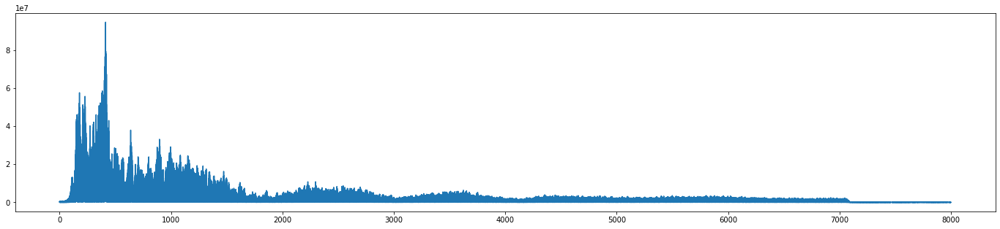

In [ ]:
plt.plot(x[:int(len(magnitude)/2)], magnitude[:int(len(fft)/2)])

In [ ]:
# lowpass filter

b = signal.firwin(151, cutoff=[100, 2000], fs=resampled_freq, pass_zero='bandpass')
filtered = signal.lfilter(b, [1,0], resampled_data)

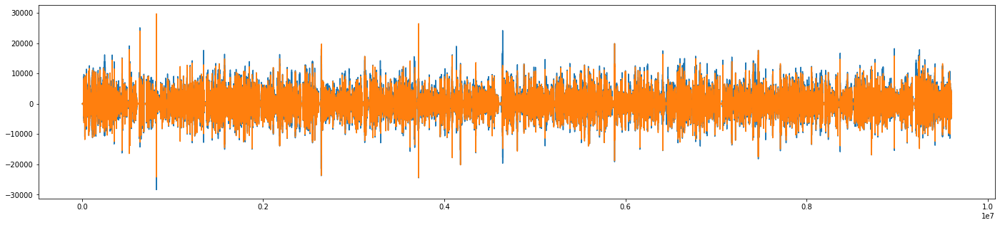

In [ ]:
plt.plot(resampled_data)
plt.plot(filtered)

In [ ]:
wavfile.write('filter.wav', resampled_freq, filtered.astype(np.int16))

In [ ]:
filtered_audio = AudioSegment.from_wav('filter.wav')

In [ ]:
filtered_audio